In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(['BAL Promyk Spray 4.svs',
                         'BAL AIA Blickfang Luft.svs']))

slides_val = list(set(['BAL 1 Spray 2.svs', 
                         'BAL Booker Spray 3.svs',
                         'BAL Bubi Spray 1.svs', 
                         'BAL cent blue Luft 2.svs']))

labels = ['Lymohozyten']

In [7]:
experiment_name = "Asthma-L0"

In [8]:
annotations_path = Path("../Statistics/Asthma_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)

annotations = annotations[annotations["class"].isin(labels)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_name,image_set,class,vector,unique_identifier,user_id,deleted,last_editor
25039,140900,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13991, 'x2': 14037, 'y1': 14520, 'y2': ...",9d552252-4980-4b09-bf78-2b7c906d41ad,10,False,None
25040,140901,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13940, 'x2': 13990, 'y1': 14521, 'y2': ...",e401f70c-df1e-4f50-8d78-3a07ed5c3cbe,10,False,None
25041,140902,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14240, 'x2': 14294, 'y1': 14441, 'y2': ...",07b795f2-a483-4191-bb32-db8f7e750234,10,False,None
25042,140903,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14446, 'x2': 14496, 'y1': 14406, 'y2': ...",4ead2c3a-a581-435d-99c3-bab31998ffee,10,False,None
25043,140904,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14496, 'x2': 14546, 'y1': 14320, 'y2': ...",d149774f-cfa4-458d-9c13-1695361ef09f,10,False,None


In [9]:
annotations["width"] = [vector["x2"] - vector["x1"] for vector in annotations["vector"]]
annotations["height"] = [vector["y2"] - vector["y1"] for vector in annotations["vector"]]
annotations["scale"] = annotations["width"] / annotations["height"]

<AxesSubplot:xlabel='width', ylabel='height'>

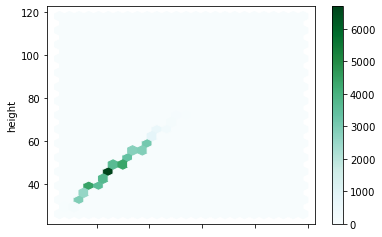

In [10]:
annotations.plot.hexbin(x='width', y='height', gridsize=25) #C='scale', 

In [11]:
slides_path = Path("../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs") if slide.name in slides_train + slides_val}
files

{'BAL 1 Spray 2.svs': WindowsPath('../Slides/BAL 1 Spray 2.svs'),
 'BAL AIA Blickfang Luft.svs': WindowsPath('../Slides/BAL AIA Blickfang Luft.svs'),
 'BAL Booker Spray 3.svs': WindowsPath('../Slides/BAL Booker Spray 3.svs'),
 'BAL Bubi Spray 1.svs': WindowsPath('../Slides/BAL Bubi Spray 1.svs'),
 'BAL cent blue Luft 2.svs': WindowsPath('../Slides/BAL cent blue Luft 2.svs'),
 'BAL Promyk Spray 4.svs': WindowsPath('../Slides/BAL Promyk Spray 4.svs')}

In [13]:
size = 512 
level = 0
bs = 16
train_images = 500
val_images = 500

In [14]:
train_files = []
val_files = []

In [15]:
for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))

train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [16]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.5,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [17]:
def get_y_func(x):
    return x.y

In [18]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=0).normalize()

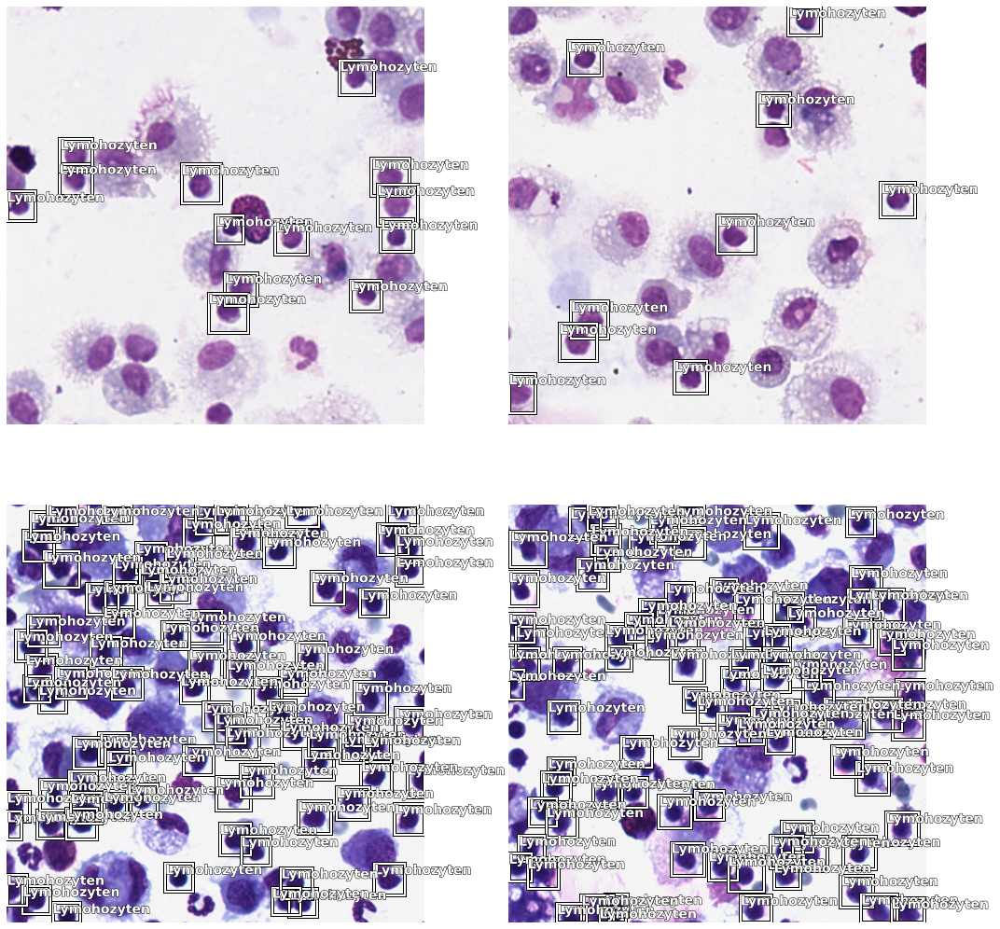

In [19]:
data.show_batch(rows=2, ds_type=DatasetType.Valid, figsize=(15,15))

In [35]:
scales = [0.7, 0.8, 0.9, 1]
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=scales)

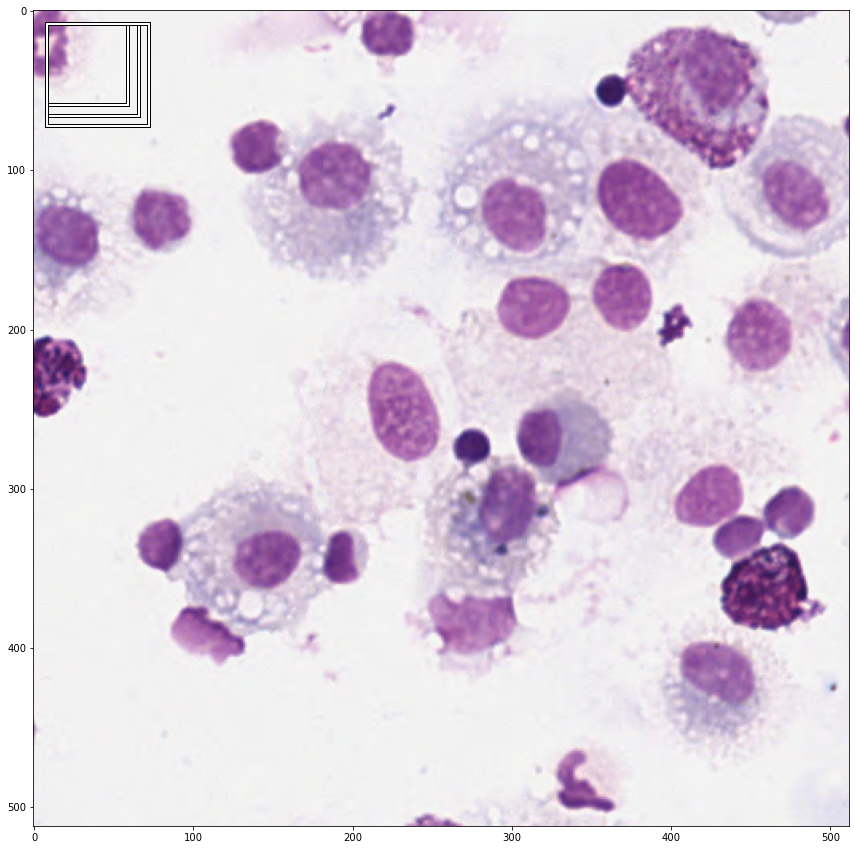

In [33]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

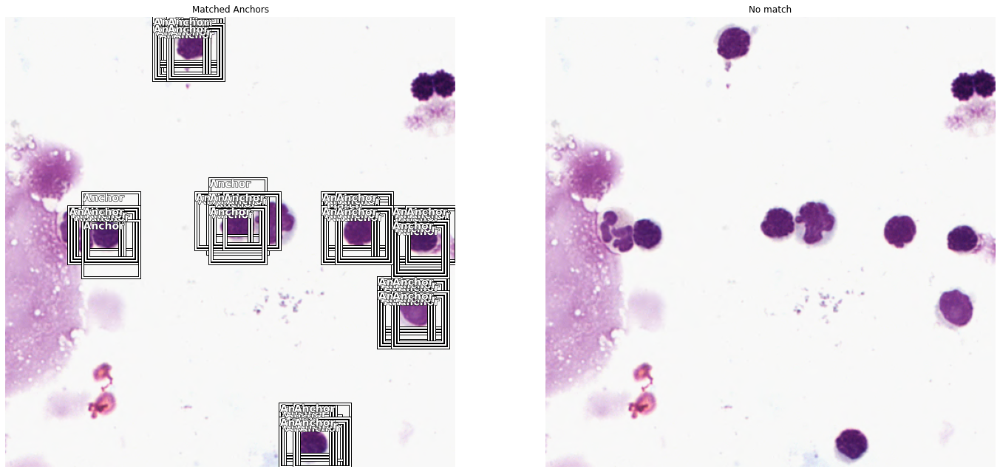

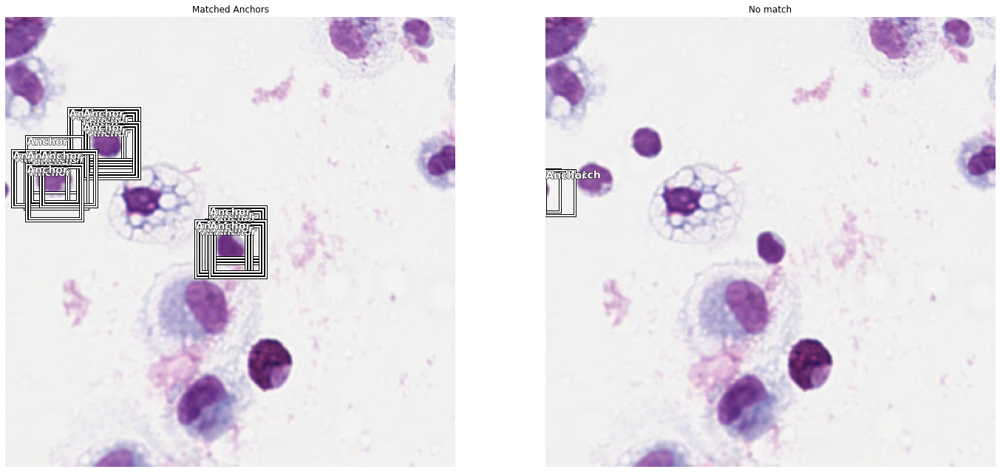

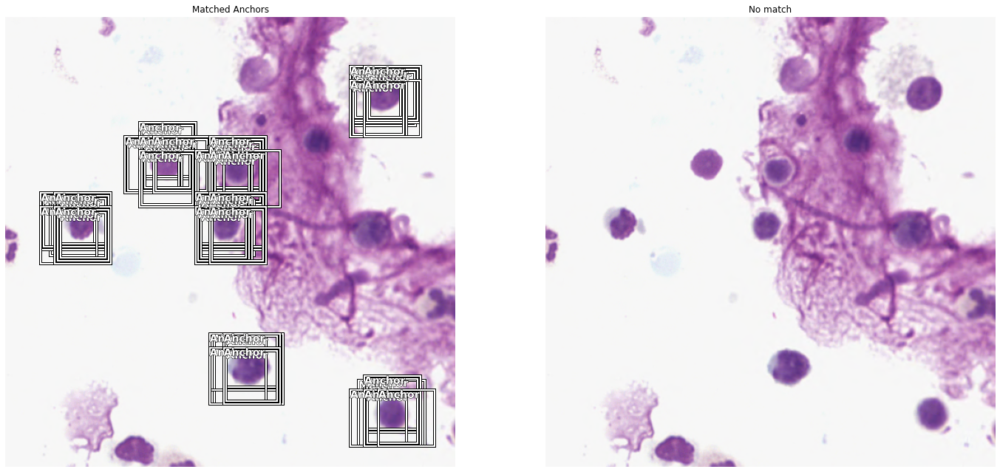

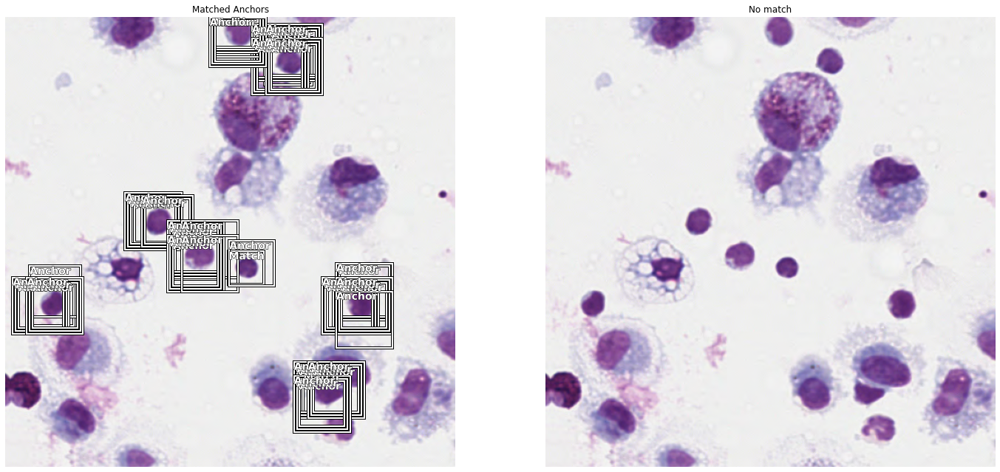

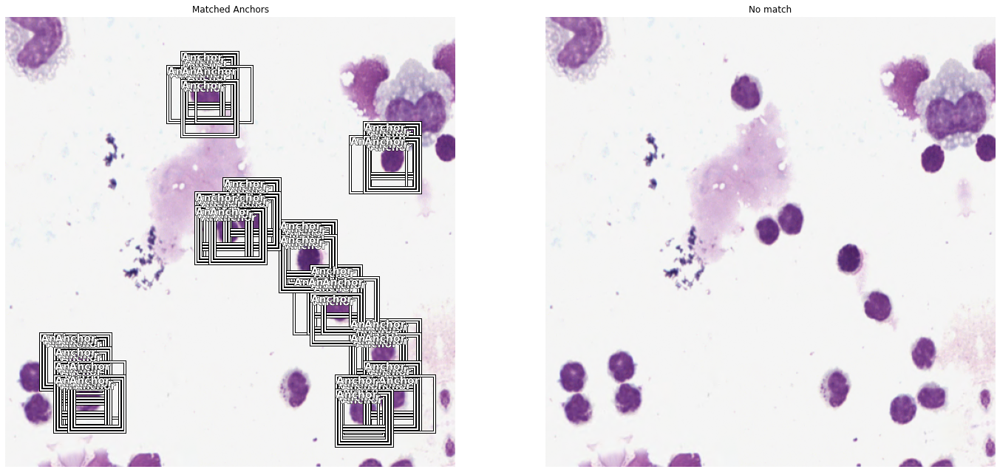

...

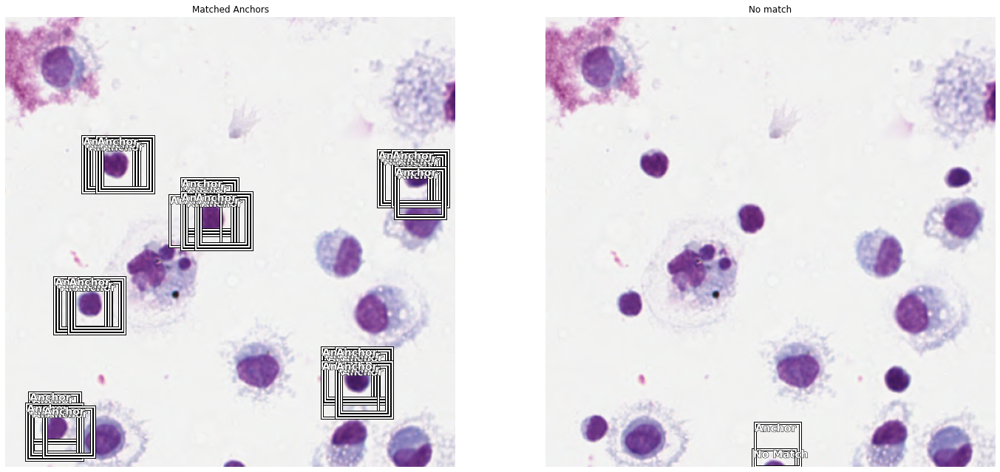

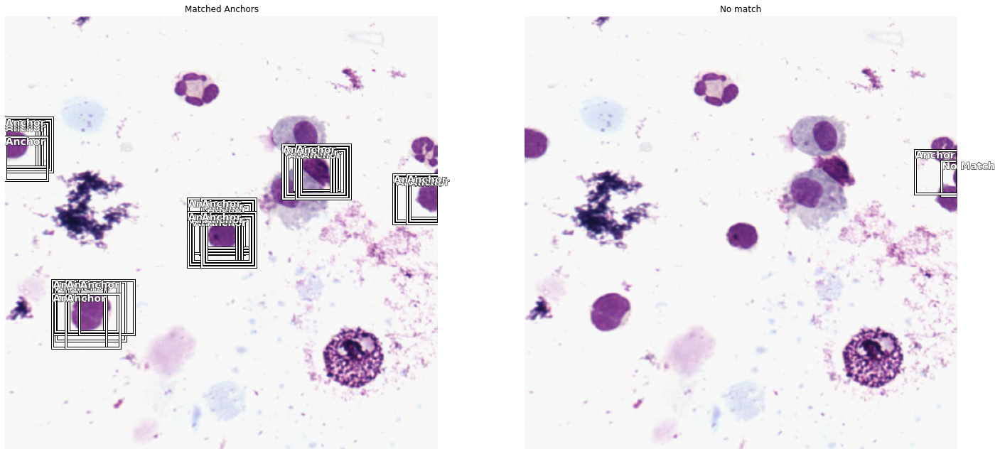

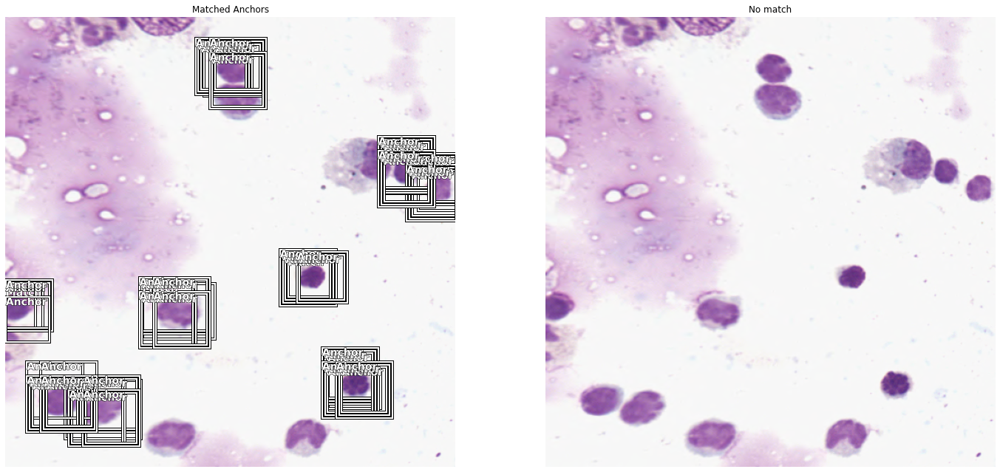

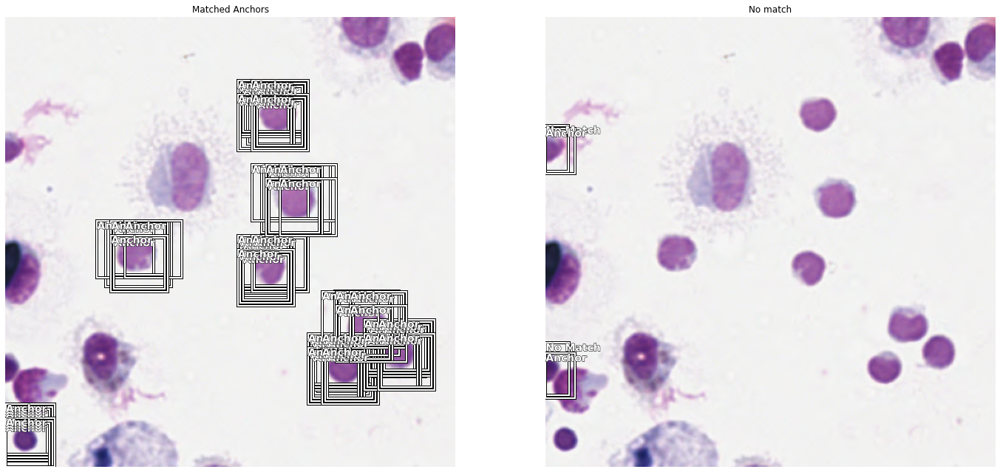

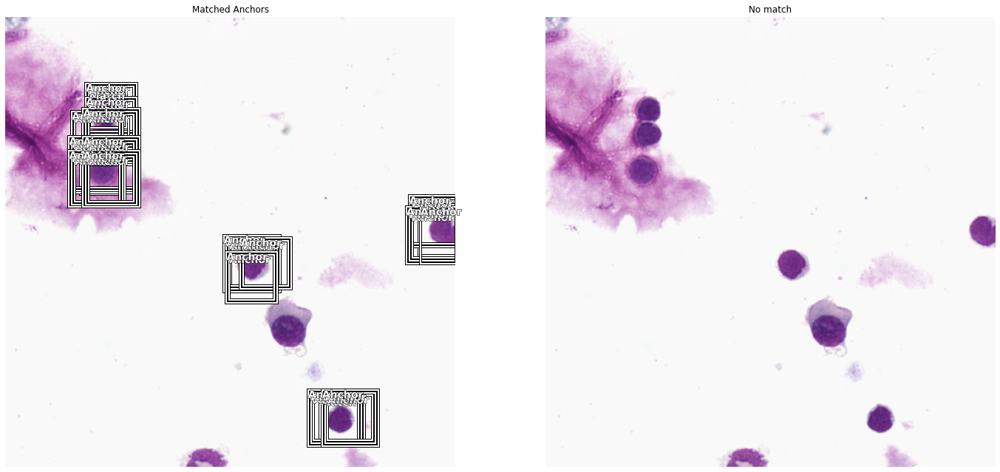

In [34]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(24, 24))

In [36]:
crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales), sizes=[32], chs=128, final_bias=-4., n_conv=2)

In [37]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics], #BBMetrics, ShowGraph
                metrics=[voc])

In [38]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [39]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,1.274100,1.122396,0.480548,0.433614,0.688782,0.480548,02:47
1,0.662561,0.521208,0.466119,0.226173,0.295035,0.466119,02:22
2,0.452835,0.582928,0.506406,0.254653,0.328275,0.506406,02:23


In [40]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.254983,0.531071,0.531628,0.190290,0.340781,0.531628,02:32
1,0.261189,0.507984,0.517571,0.195331,0.312653,0.517571,02:25
2,0.291234,0.473581,0.558417,0.215710,0.257871,0.558417,02:39
3,0.275940,0.480687,0.510394,0.183623,0.297063,0.510394,02:31
4,0.248490,0.402861,0.508665,0.134613,0.268249,0.508665,02:33
5,0.230686,0.358046,0.599196,0.159415,0.198631,0.599196,02:36
6,0.207841,0.332703,0.600480,0.102375,0.230328,0.600480,02:31
7,0.190736,0.326419,0.592675,0.131411,0.195008,0.592675,02:23
8,0.177612,0.372661,0.598546,0.129055,0.243606,0.598546,02:29
9,0.170303,0.350587,0.596248,0.115938,0.234648,0.596248,02:20


In [41]:
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.161326,0.395511,0.606166,0.128639,0.266872,0.606166,02:18
1,0.182453,0.390027,0.494361,0.125562,0.264465,0.494361,02:26
2,0.195749,0.502928,0.591410,0.223848,0.279079,0.591410,02:29
3,0.259841,0.697133,0.517382,0.249318,0.447814,0.517382,02:23
4,0.263355,0.479580,0.598669,0.174771,0.304808,0.598669,03:00
5,0.232436,0.355571,0.577014,0.153609,0.201962,0.577014,03:25
6,0.210547,0.451679,0.592026,0.160297,0.291382,0.592026,02:50
7,0.193998,0.408576,0.582839,0.172242,0.236334,0.582839,03:48
8,0.182851,0.376258,0.592696,0.142280,0.233978,0.592696,02:51
9,0.176227,0.398258,0.599993,0.154596,0.243662,0.599993,03:43


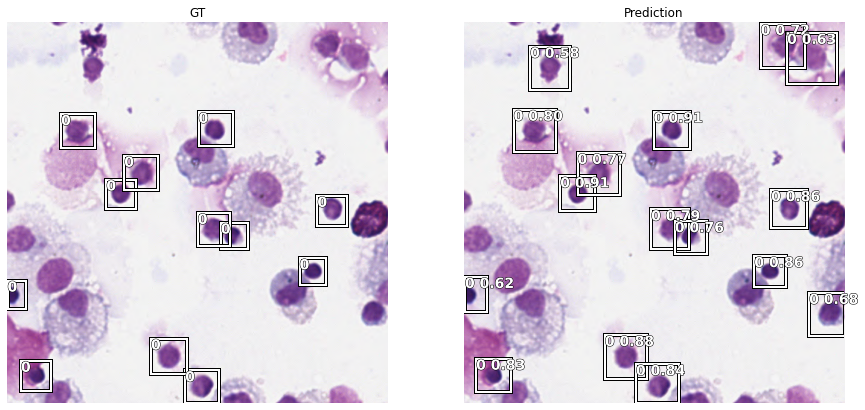

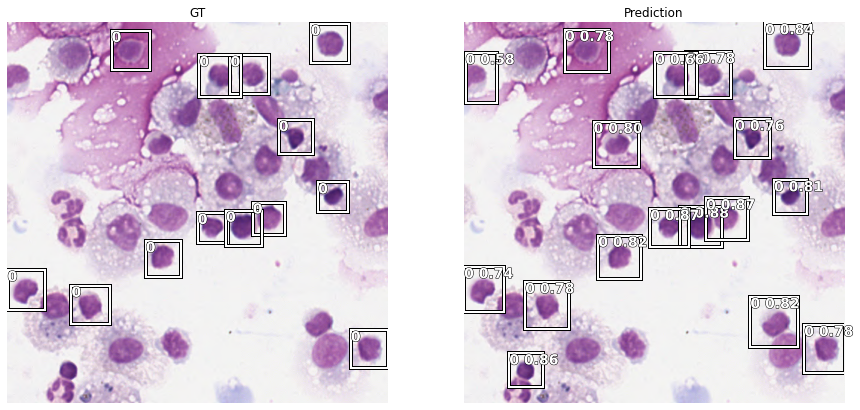

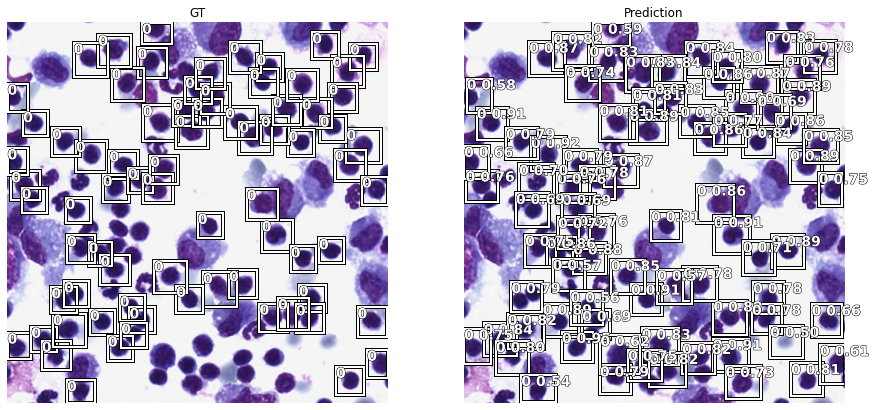

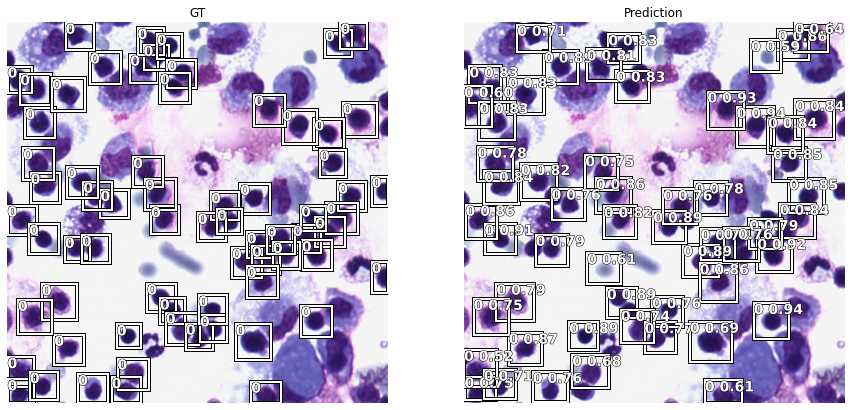

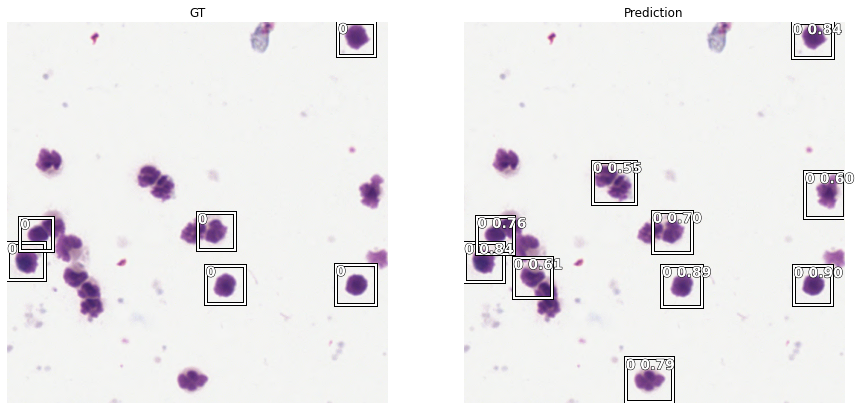

In [43]:
slide_object_result(learn, anchors, detect_thresh=0.5, nms_thresh=0.2)